In [1]:
import numpy as np
import stumpy
import numpy.testing as npt
import time

In [2]:
T = np.random.rand(336)

In [3]:
m = 12

In [4]:
mp = stumpy.stump(T, m)

In [5]:
stream = stumpy.stumpi(T, m, egress=False)  # Don't egress/remove the oldest data point when streaming

In [6]:
t = np.random.rand()

In [7]:
stream.update(t)

In [8]:
for i in range(1000):
    t = np.random.rand()
    stream.update(t)

In [9]:
T_full = np.random.rand(64)
m = 8

mp = stumpy.stump(T_full, m)
P_full = mp[:, 0]
I_full = mp[:, 1]

In [10]:
# Start with half of the full length time series and initialize inputs
T_stream = T_full[:10].copy()
stream = stumpy.stumpi(T_stream, m, egress=False)  # Don't remove/egress the oldest data point when streaming

# Incrementally add one new data point at a time and update the matrix profile
for i in range(len(T_stream), len(T_full)):
    t = T_full[i]
    stream.update(t)

In [11]:
npt.assert_almost_equal(stream.T_, T_full)
npt.assert_almost_equal(stream.P_, P_full)
npt.assert_almost_equal(stream.I_, I_full)

In [12]:
T_full = np.random.rand(10_000)
T_stream = T_full[:200].copy()
m = 100

# `stumpy.stump` timing
start = time.time()
mp = stumpy.stump(T_stream, m)
for i in range(200, len(T_full)):
    T_stream = np.append(T_stream, T_full[i])
    mp = stumpy.stump(T_stream, m)
stump_time = time.time() - start

# `stumpy.stumpi` timing
stream = stumpy.stumpi(T_stream, m, egress=False)  # Don't egress/remove the oldest data point when streaming
start = time.time()
for i in range(200, len(T_full)):
    t = T_full[i]
    stream.update(t)
stumpi_time = time.time() - start

print(f"stumpy.stump: {np.round(stump_time,1)}s")
print(f"stumpy.stumpi: {np.round(stumpi_time, 1)}s")

stumpy.stump: 362.5s
stumpy.stumpi: 7.3s


In [13]:
stream = stumpy.stumpi(T_stream, m, egress=True)  # Egressing/removing the oldest data point is the default behavior!

In [14]:
# `stumpy.stumpi` timing with egress
stream = stumpy.stumpi(T_stream, m, egress=True)
start = time.time()
for i in range(200, len(T_full)):
    t = T_full[i]
    stream.update(t)
stumpi_time = time.time() - start

print(f"stumpy.stumpi: {np.round(stumpi_time, 1)}s")

stumpy.stumpi: 3.7s


In [15]:
%matplotlib inline

import pandas as pd
import stumpy
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib import animation
from IPython.display import HTML
import os

plt.style.use('https://raw.githubusercontent.com/TDAmeritrade/stumpy/main/docs/stumpy.mplstyle')

steam_df = pd.read_csv("https://zenodo.org/record/4273921/files/STUMPY_Basics_steamgen.csv?download=1")
steam_df.head()

,drum pressure,excess oxygen,water level,steam flow
0,320.08239,2.506774,0.032701,9.302970
1,321.71099,2.545908,0.284799,9.662621
2,320.91331,2.360562,0.203652,10.990955
3,325.00252,0.027054,0.326187,12.430107
4,326.65276,0.285649,0.753776,13.681666


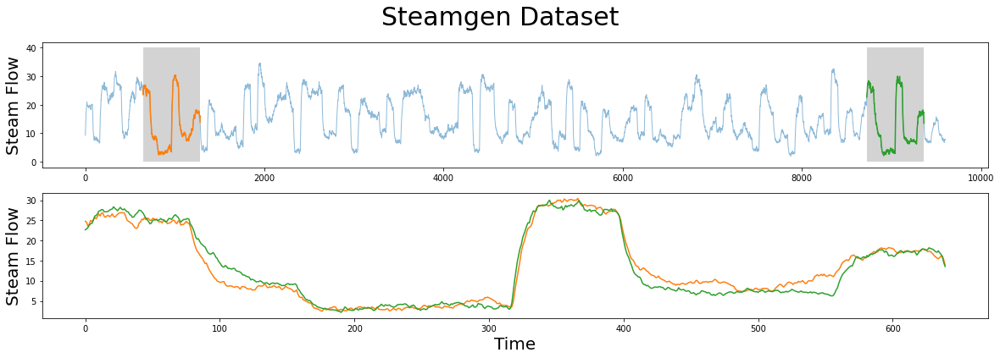

In [16]:
m = 640
fig, axs = plt.subplots(2)
plt.suptitle('Steamgen Dataset', fontsize='30')
axs[0].set_ylabel("Steam Flow", fontsize='20')
axs[0].plot(steam_df['steam flow'], alpha=0.5, linewidth=1)
axs[0].plot(steam_df['steam flow'].iloc[643:643+m])
axs[0].plot(steam_df['steam flow'].iloc[8724:8724+m])
rect = Rectangle((643, 0), m, 40, facecolor='lightgrey')
axs[0].add_patch(rect)
rect = Rectangle((8724, 0), m, 40, facecolor='lightgrey')
axs[0].add_patch(rect)
axs[1].set_xlabel("Time", fontsize='20')
axs[1].set_ylabel("Steam Flow", fontsize='20')
axs[1].plot(steam_df['steam flow'].values[643:643+m], color='C1')
axs[1].plot(steam_df['steam flow'].values[8724:8724+m], color='C2')
plt.show()

In [17]:
T_full = steam_df['steam flow'].values
T_stream = T_full[:2000]
stream = stumpy.stumpi(T_stream, m, egress=False)  # Don't egress/remove the oldest data point when streaming

In [18]:
windows = [(stream.P_, T_stream)]
P_max = -1
for i in range(2000, len(T_full)):
    t = T_full[i]
    stream.update(t)

    if i % 50 == 0:
        windows.append((stream.P_, T_full[:i+1]))
        if stream.P_.max() > P_max:
            P_max = stream.P_.max()

In [19]:
fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0})

rect = Rectangle((643, 0), m, 40, facecolor='lightgrey')
axs[0].add_patch(rect)
rect = Rectangle((8724, 0), m, 40, facecolor='lightgrey')
axs[0].add_patch(rect)
axs[0].set_xlim((0, T_full.shape[0]))
axs[0].set_ylim((-0.1, T_full.max()+5))
axs[1].set_xlim((0, T_full.shape[0]))
axs[1].set_ylim((-0.1, P_max+5))
axs[0].axvline(x=643, linestyle="dashed")
axs[0].axvline(x=8724, linestyle="dashed")
axs[1].axvline(x=643, linestyle="dashed")
axs[1].axvline(x=8724, linestyle="dashed")
axs[0].set_ylabel("Steam Flow", fontsize='20')
axs[1].set_ylabel("Matrix Profile", fontsize='20')
axs[1].set_xlabel("Time", fontsize='20')


lines = []
for ax in axs:
    line, = ax.plot([], [], lw=2)
    lines.append(line)
line, = axs[1].plot([], [], lw=2)
lines.append(line)

def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(window):
    P, T = window
    for line, data in zip(lines, [T, P]):
        line.set_data(np.arange(data.shape[0]), data)

    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=windows, interval=100,
                               blit=True, repeat=False)

anim_out = anim.to_jshtml()
plt.close()  # Prevents duplicate image from displaying
if os.path.exists("None0000000.png"):
    os.remove("None0000000.png")  # Delete rogue temp file

HTML(anim_out)
# anim.save('/tmp/stumpi.mp4')

In [20]:
T_full = np.random.rand(64)
m = 8

T_stream = T_full[:10].copy()
stream = stumpy.stumpi(T_stream, m, egress=False)  # Don't egress/remove the oldest data point when streaming. To egress, set `egress=True`

for i in range(len(T_stream), len(T_full)):
    t = T_full[i]
    stream.update(t)

print(f"Full Matrix Profile: {np.round(stream.P_, 2)}")
print(f"Left Matrix Profile: {np.round(stream.left_P_, 2)}")
print(f"Full Matrix Profile Indices: {stream.I_}")
print(f"Left Matrix Profile Indices: {stream.left_I_}")

Full Matrix Profile: [2.31 2.35 2.07 1.88 1.29 1.42 1.5  2.37 2.34 2.1  2.01 2.06 1.95 1.88
 1.29 1.42 1.5  1.48 1.55 2.45 2.42 1.69 2.38 1.59 1.48 1.55 2.41 1.75
 1.88 1.84 2.16 2.34 1.99 2.06 1.89 2.59 2.54 2.37 2.43 2.56 2.54 2.28
 2.51 2.68 2.16 2.1  1.95 2.38 2.3  1.75 1.88 1.84 2.13 2.01 2.24 1.99
 1.93]
Left Matrix Profile: [ inf  inf  inf 3.91 3.87 3.39 3.34 3.59 3.05 2.69 2.56 2.87 2.07 1.88
 1.29 1.42 1.5  2.69 2.81 2.64 2.42 1.69 2.38 1.59 1.48 1.55 2.45 1.81
 2.09 2.79 2.34 2.34 2.15 2.06 1.89 2.61 2.67 2.37 2.43 2.56 2.54 2.28
 2.51 2.68 2.16 2.1  1.95 2.38 2.3  1.75 1.88 1.84 2.13 2.01 2.24 1.99
 1.93]
Full Matrix Profile Indices: [44 45 12 13 14 15 16 37 30 45 46 33 46  3  4  5  6 24 25 26 13 14 15 16
 17 18 48 49 50 51 44  9 55 11 21 47 48  7  8 31  0  5  2 23 30  9 12 13
 14 27 28 29  9 10 34 32  3]
Left Matrix Profile Indices: [-1 -1 -1  0  0  0  1  4  3  4  5  4  2  3  4  5  6 10 11  0 13 14 15 16
 17 18 19 15 23 24  8  9 10 11 21 21 16  7  8 31  0  5  2 23 30  9 12 